In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir('C:/Users/sumak/Desktop/input'))

# Any results you write to the current directory are saved as output.


['aptos2019-blindness-detection', 'diabetic-retinopathy-resized']


In [ ]:
#Taranmış resimleri kaydettiğimiz klasörün yolunu (path) “yol” isimli değişkene atayalım ve bu yolda (klasörde) bulunan dosyaları “liste_yol” isimli değişkene aktaralım.
#“liste_yol” isimli değişkenimiz bir listedir ve ilgili yoldaki dosyaları string formatında, isimleriyle tutar.
#Örnek: [“taranmış_resim_1.jpg”, “taranmış_resim_2.jpg”]
#l_p resimlerin yollarını hafızada tutar.
# im_nu l_p deki resimlerin indexlerini tutar.
#Yeni oluşturduğumuz resimlerin yeni_resimler klasörüne kaydedilirken isimlendirilmesinde kullanacağımız integer değişkenimizdir.
#crop: Kesme işleminin yapılıp yapılmadığını belirlemede kullanılacak boolean değişkendir.


path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/"
list_path = os.listdir( path )
print("Isimler \n")
print(list_path ,"\n")

print("Yollar \n")
l_p = [path+nesne for nesne in list_path if ".jpg" or ".png" in nesne]
print(l_p)

In [2]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
#from imgaug import augmenters as iaa
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000 # use 1000 when you just want to explore new idea, use -1 for full train

Using TensorFlow backend.


In [3]:
df_train = pd.read_csv('C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/train.csv')
df_test = pd.read_csv('C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test.csv')

x = df_train['id_code']
y = df_train['diagnosis']

x, y = shuffle(x, y, random_state=SEED)

(3112,) (3112,) 
 (550,) (550,)


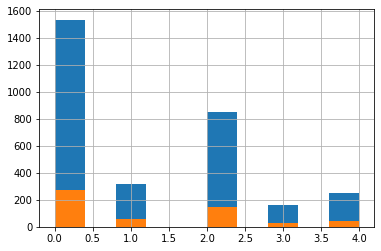

In [4]:
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                                      stratify=y, random_state=SEED)
print(train_x.shape, train_y.shape,"\n", valid_x.shape, valid_y.shape)
train_y.hist()
valid_y.hist()

In [5]:
def load_ben_color(path, sigmaX=10):
    
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)        
    return image

In [6]:
def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img

In [7]:
def circle_crop(img, sigmaX=10):   
    """
    Create circular crop around image centre    
    """    
    # RESIME GORE YUVARLAK OLUSTURUP MASKELIYOR
    img = cv2.imread(img)
   #img = crop_image_from_gray(img)     neden sılındı bır bak
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    height, width, depth = img.shape    
    
    x = int(width/2)
    y = int(height/2)
    r = np.amin((x,y))
    #bitwise_and -- bitdüzeyi
    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128) # load_ben_color satırı
    return img 

In [8]:
#first images

%%time
NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = cv2.imread(path)
        
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )

UsageError: Line magic function `%%time` not found.


In [9]:
#fit images

%%time
NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )

UsageError: Line magic function `%%time` not found.


Wall time: 2.34 s


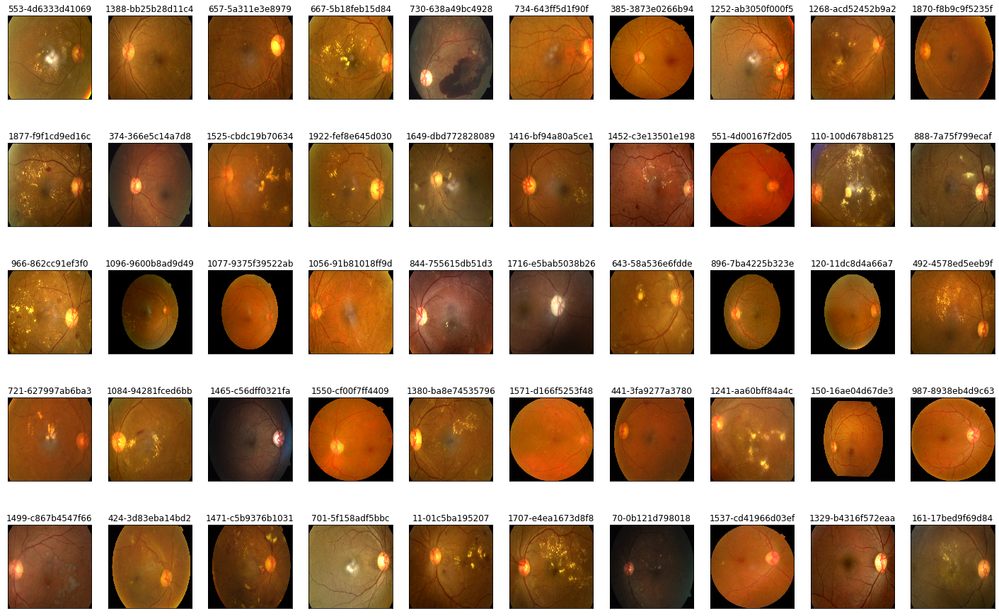

In [12]:
#color images RGB

%%time
NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )

Wall time: 1.96 s


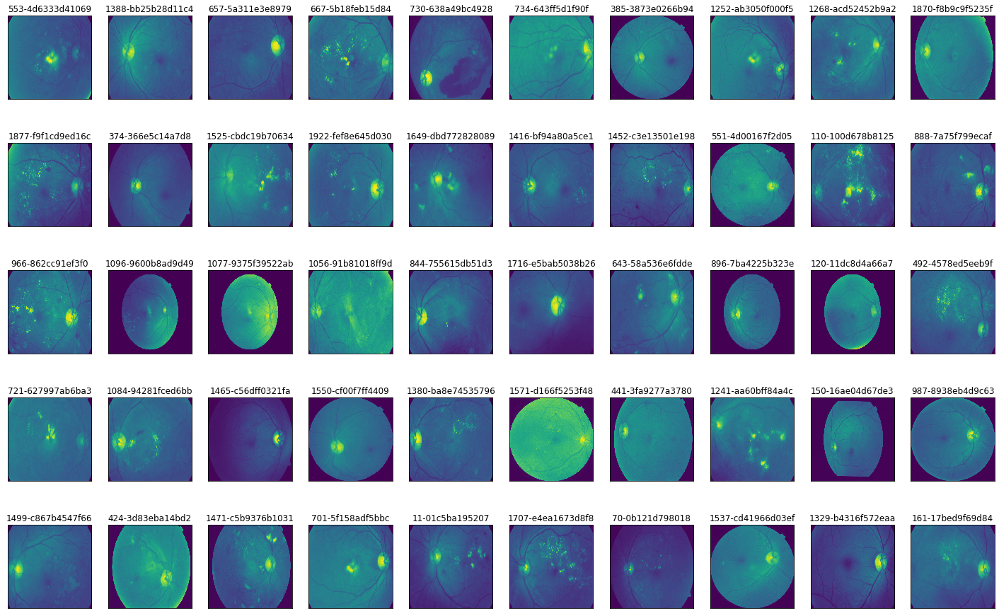

In [13]:
#gray images

%%time
NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = cv2.imread(path)
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )

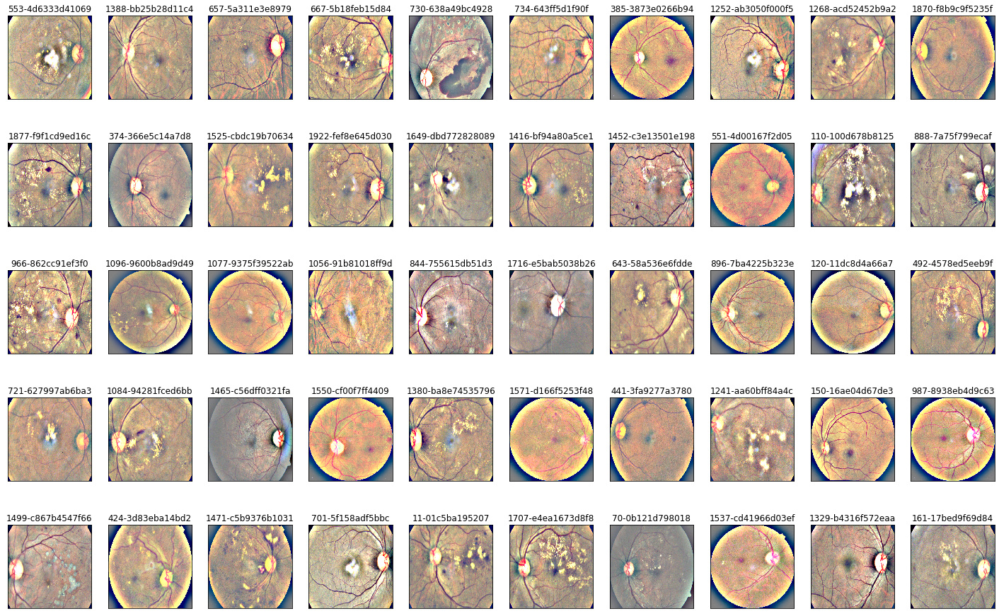

In [14]:
#load_ben_color

#%%time
NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = load_ben_color(path,sigmaX=30)
        
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )

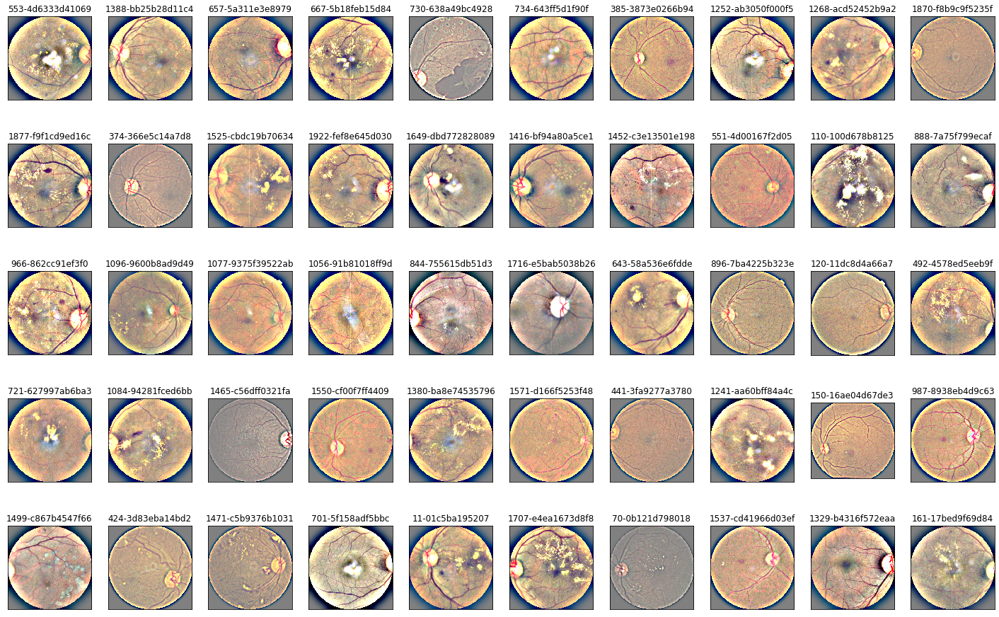

In [15]:
#circle_crop and load_ben_color

NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = circle_crop(path,sigmaX=30)       
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']))

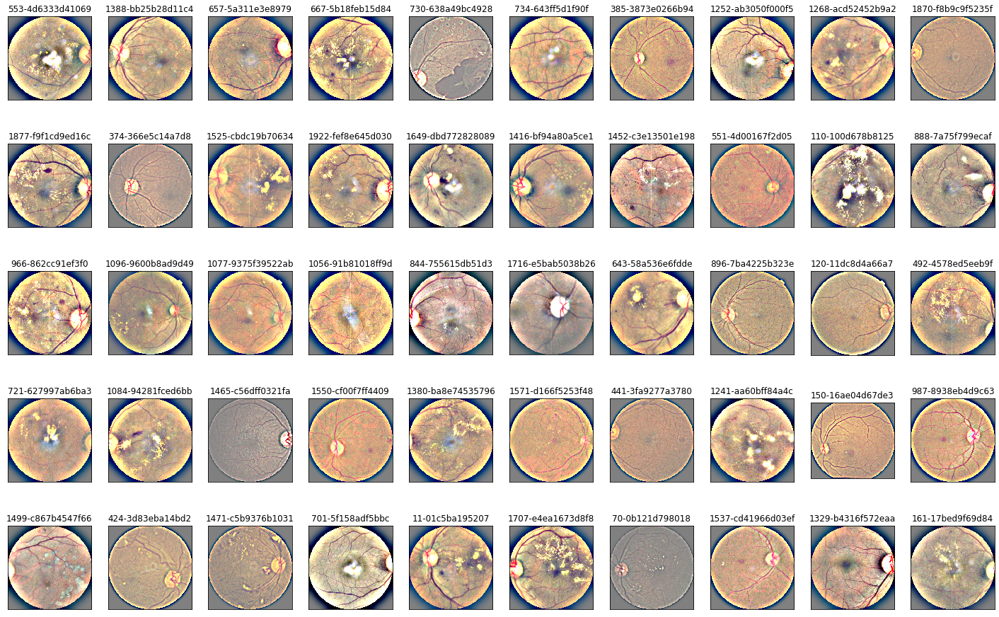

In [39]:
# Kaydetme circle_crop and  load_ben_color
from time import time, sleep
import matplotlib

NUM_SAMP=10
fig = plt.figure(figsize=(25,16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = circle_crop(path,sigmaX=30)
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )
       # matplotlib.image.imsave(f"D:\Phyton_crop\crop_images\`{row['id_code']}`.png", image)

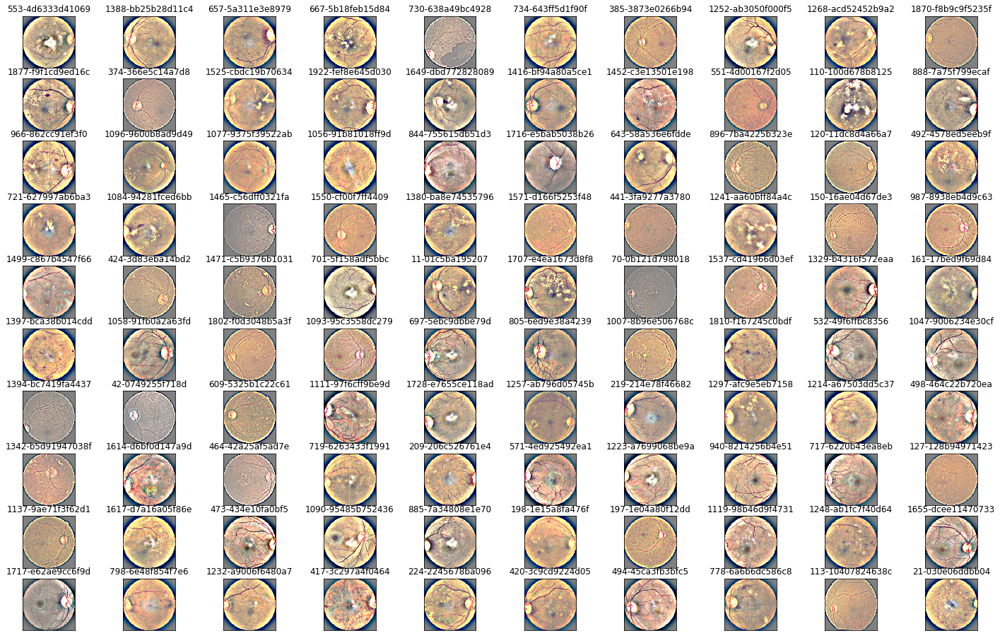

In [38]:
# Kaydetme 20x20 circle_crop and  load_ben_color
from time import time, sleep
import matplotlib

NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(10):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(10, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = circle_crop(path,sigmaX=30)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )
       # matplotlib.image.imsave(f"D:/mocococo/Phyton_crop/crop_images/`{row['id_code']}`.png", image)

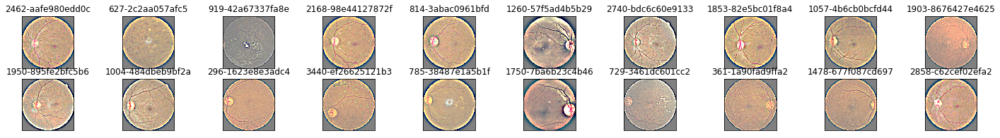

In [10]:
# Kaydetme train database circle_crop and  load_ben_color
from time import time, sleep
import matplotlib

NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(2):
    for i, (idx, row) in enumerate(df_train.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(10, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = circle_crop(path,sigmaX=30)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )
       # matplotlib.image.imsave(f"D:/mocococo/Phyton_crop/crop_images/`{row['id_code']}`.png", image)

In [ ]:
# Kaydetme circle_crop and  load_ben_color
from time import time, sleep
import matplotlib

NUM_SAMP=10
fig = plt.figure(figsize=(25, 16))
for jj in range(3662):
    for i, (idx, row) in enumerate(df_train.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        #ax = fig.add_subplot(1, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"C:/Users/sumak/Desktop/input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = circle_crop(path,sigmaX=30)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        #plt.imshow(image)
        #ax.set_title('%d-%s' % (idx, row['id_code']) )
        matplotlib.image.imsave(f"D:/mocococo/Phyton_crop/crop_images/{row['id_code']}.png", image)

In [ ]:
plt.figure()

path=f"D:/mocococo/Phyton_crop/crop_images/`1b3647865779`.png"
image = cv2.imread(path)
plt.imshow(image)

plt.imshow(image)
plt.colorbar()
plt.grid(False)
plt.show()